In [49]:
import pandas as pd
import re
from tokenizers import Tokenizer, models, pre_tokenizers, trainers, decoders
from tokenizers.normalizers import NFD, Lowercase, StripAccents, Sequence as NormalizerSequence
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from sklearn.preprocessing import LabelEncoder, normalize
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
import time

Step 1: Load and Clean Tweet Data

In [17]:
df = pd.read_csv("train_data/train.csv")  # Replace with your actual CSV path
df = df.dropna(subset=["text"])

texts = df["text"].astype(str).tolist()

In [18]:
def clean_tweet(tweet):
    tweet = tweet.lower()
    tweet = re.sub(r"http\S+|www\S+|https\S+", "", tweet)
    tweet = re.sub(r"@\w+", "", tweet)
    tweet = re.sub(r"#\w+", "", tweet)
    tweet = re.sub(r"[^\w\s]", "", tweet)
    tweet = re.sub(r"\s+", " ", tweet).strip()
    return tweet

cleaned_texts = [clean_tweet(t) for t in texts]
df["cleaned_text"] = cleaned_texts

# Save cleaned tweets to a file for BPE training
with open("cleaned_tweets.txt", "w", encoding="utf-8") as f:
    for line in cleaned_texts:
        f.write(line + "\n")

In [19]:
df

,textID,text,selected_text,sentiment,cleaned_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,id have responded if i were going
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,sooo sad i will miss you here in san diego
2,088c60f138,my boss is bullying me...,bullying me,negative,my boss is bullying me
3,9642c003ef,what interview! leave me alone,leave me alone,negative,what interview leave me alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,sons of why couldnt they put them on the relea...
...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,wish we could come see u on denver husband los...
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,ive wondered about rake to the client has made...
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,yay good for both of you enjoy the break you p...
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,but it was worth it


GPT2 Tokenizer and Embedding

In [24]:
from transformers import GPT2Tokenizer, GPT2Model
import torch
import numpy as np

# tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
# model = GPT2Model.from_pretrained("gpt2")
# model.eval()

# def get_gpt2_embedding(text):
#     inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=50)
    
#     # Decode the token ids into readable tokens
#     token_ids = inputs['input_ids'][0]
#     tokens = [tokenizer.decode([token_id]) for token_id in token_ids]

#     print(f"Original text: {text}")
#     print(f"Token IDs: {token_ids.tolist()}")
#     print(f"Tokens: {tokens}")
#     print("-" * 50)
    
#     with torch.no_grad():
#         outputs = model(**inputs)

#     return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()


check for rows with only white spaces or is empty

In [20]:
# Identify rows where cleaned_text is empty or only whitespace
empty_or_whitespace_rows = df[df["cleaned_text"].str.strip() == ""]

# Display them
print("Rows with empty or whitespace-only 'cleaned_text':")
print(empty_or_whitespace_rows)


Rows with empty or whitespace-only 'cleaned_text':
           textID                                     text  \
698    2f6d9d1419    #stackeoverflow  http://bit.ly/13Nfk1   
1033   6c2e853e4c  ??????? #bash ?? ??????? ????????? ????   
8120   4a265d8a34                                     ****   
24926  0872ed0f00      www.youtube.com/watch?v=9FtuV3xMrN0   
25691  f7286fdad8                          @_Cheshire_Cat_   
26005  0b3fe0ca78                                        ?   

                             selected_text sentiment cleaned_text  
698                        #stackeoverflow   neutral               
1033                                 #bash   neutral               
8120                                  ****  negative               
24926  www.youtube.com/watch?v=9FtuV3xMrN0   neutral               
25691                       _Cheshire_Cat_   neutral               
26005                                    ?   neutral               


In [21]:
df = df[df["cleaned_text"].str.strip().astype(bool)]  # Remove empty or whitespace-only rows

In [22]:
df

,textID,text,selected_text,sentiment,cleaned_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,id have responded if i were going
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,sooo sad i will miss you here in san diego
2,088c60f138,my boss is bullying me...,bullying me,negative,my boss is bullying me
3,9642c003ef,what interview! leave me alone,leave me alone,negative,what interview leave me alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,sons of why couldnt they put them on the relea...
...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,wish we could come see u on denver husband los...
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,ive wondered about rake to the client has made...
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,yay good for both of you enjoy the break you p...
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,but it was worth it


In [25]:
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
model = GPT2Model.from_pretrained("gpt2")
model.eval()

def get_gpt2_embedding(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=50)
    # Decode the token ids into readable tokens
    token_ids = inputs['input_ids'][0]
    tokens = [tokenizer.decode([token_id]) for token_id in token_ids]

    print(f"Original text: {text}")
    print(f"Token IDs: {token_ids.tolist()}")
    print(f"Tokens: {tokens}")
    print("-" * 50)

    with torch.no_grad():
        outputs = model(**inputs)
        
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

print("Generating GPT-2 embeddings...")
df["embedding"] = df["cleaned_text"].apply(get_gpt2_embedding)
X_embed = np.stack(df["embedding"].values)


Generating GPT-2 embeddings...
Original text: id have responded if i were going
Token IDs: [312, 423, 7082, 611, 1312, 547, 1016]
Tokens: ['id', ' have', ' responded', ' if', ' i', ' were', ' going']
--------------------------------------------------
Original text: sooo sad i will miss you here in san diego
Token IDs: [568, 2238, 6507, 1312, 481, 2051, 345, 994, 287, 5336, 4656, 2188]
Tokens: ['so', 'oo', ' sad', ' i', ' will', ' miss', ' you', ' here', ' in', ' san', ' die', 'go']
--------------------------------------------------
Original text: my boss is bullying me
Token IDs: [1820, 6478, 318, 20714, 502]
Tokens: ['my', ' boss', ' is', ' bullying', ' me']
--------------------------------------------------
Original text: what interview leave me alone
Token IDs: [10919, 2720, 2666, 502, 3436]
Tokens: ['what', ' interview', ' leave', ' me', ' alone']
--------------------------------------------------
Original text: sons of why couldnt they put them on the releases we already bought
To

C:\Users\hp\AppData\Local\Temp\ipykernel_55496\3712081134.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["embedding"] = df["cleaned_text"].apply(get_gpt2_embedding)


In [26]:
df

,textID,text,selected_text,sentiment,cleaned_text,embedding
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,id have responded if i were going,"[-0.032028425, -0.06639114, -0.50131255, 0.166..."
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,sooo sad i will miss you here in san diego,"[0.1424701, -0.14489348, -0.32122722, 0.017175..."
2,088c60f138,my boss is bullying me...,bullying me,negative,my boss is bullying me,"[-0.23530324, -0.15648843, -0.5661439, 0.05345..."
3,9642c003ef,what interview! leave me alone,leave me alone,negative,what interview leave me alone,"[-0.07578776, 0.18264183, -0.7707238, 0.034800..."
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,sons of why couldnt they put them on the relea...,"[-0.17014356, -0.15262508, -0.17668657, 0.1910..."
...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,wish we could come see u on denver husband los...,"[-0.0065419874, -0.3327701, -0.41877195, 0.207..."
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,ive wondered about rake to the client has made...,"[0.0070875827, -0.26256576, -0.47015744, -0.05..."
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,yay good for both of you enjoy the break you p...,"[0.087007046, -0.15201688, -0.24028909, 0.0133..."
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,but it was worth it,"[0.11040521, -0.058627017, -0.33192387, -0.079..."


Label 

In [27]:
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df["sentiment"])
y = to_categorical(y, num_classes=3)

Classical Model

In [28]:
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X_embed, y, test_size=0.2, random_state=42)

In [73]:
# model_classical = Sequential([
#     keras.Input(shape=(X_embed.shape[1],)),
#     Dense(128, activation='relu'),
#     Dense(64, activation='relu'),
#     Dense(3, activation='softmax')
# ])
start_cls = time.time()
model_classical = Sequential([
    Dense(128, activation='relu', input_shape=(X_embed.shape[1],)),
    Dense(64, activation='relu'),
    Dense(3, activation='softmax')
])

In [74]:
model_classical.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

In [75]:
model_classical.fit(X_train_c, y_train_c, validation_data=(X_test_c, y_test_c), epochs=50, batch_size=32)

Epoch 1/50
687/687 [==============================] - 2s 3ms/step - loss: 0.9348 - accuracy: 0.5896 - val_loss: 0.7638 - val_accuracy: 0.6588
Epoch 2/50
687/687 [==============================] - 2s 3ms/step - loss: 0.7742 - accuracy: 0.6516 - val_loss: 0.7402 - val_accuracy: 0.6730
Epoch 3/50
687/687 [==============================] - 2s 3ms/step - loss: 0.7455 - accuracy: 0.6674 - val_loss: 0.7425 - val_accuracy: 0.6681
Epoch 4/50
687/687 [==============================] - 2s 3ms/step - loss: 0.7232 - accuracy: 0.6764 - val_loss: 0.7321 - val_accuracy: 0.6768
Epoch 5/50
687/687 [==============================] - 2s 3ms/step - loss: 0.7085 - accuracy: 0.6849 - val_loss: 0.7302 - val_accuracy: 0.6755
Epoch 6/50
687/687 [==============================] - 2s 3ms/step - loss: 0.7044 - accuracy: 0.6862 - val_loss: 0.7088 - val_accuracy: 0.6904
Epoch 7/50
687/687 [==============================] - 2s 3ms/step - loss: 0.6974 - accuracy: 0.6897 - val_loss: 0.7135 - val_accuracy: 0.6912
Epoch 

In [76]:
loss_c, acc_c = model_classical.evaluate(X_test_c, y_test_c)
print(f"\n Classical Model Accuracy: {acc_c:.4f}")

172/172 [==============================] - 0s 2ms/step - loss: 1.0161 - accuracy: 0.6528

 Classical Model Accuracy: 0.6528


In [77]:
end_cls = time.time()

Comparison of Quantum Angle encoding vs Amplitude Encoding

Quantum Feature Map (ZZFeatureMap)

In [46]:
from sklearn.decomposition import PCA
from qiskit.circuit.library import ZZFeatureMap
from qiskit.quantum_info import Statevector
import matplotlib.pyplot as plt

PCA Variance Explained Plot

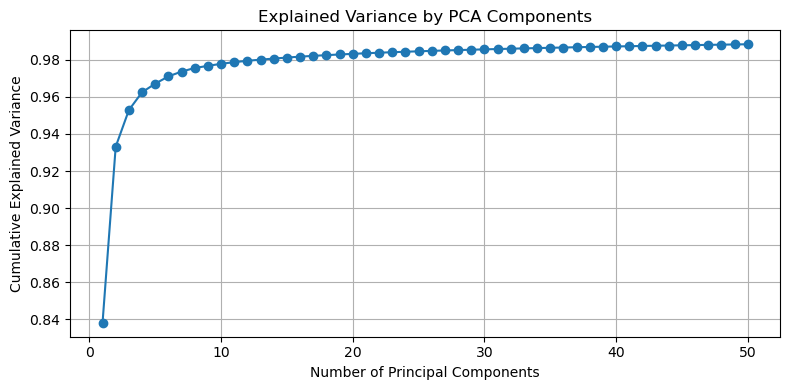

In [47]:
pca_all = PCA(n_components=50)
X_pca_all = pca_all.fit_transform(X_embed)
explained = np.cumsum(pca_all.explained_variance_ratio_)
plt.figure(figsize=(8, 4))
plt.plot(range(1, 51), explained, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA Components')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
pca_zz = PCA(n_components=4)
X_reduced_zz = pca_zz.fit_transform(X_embed)

In [43]:
X_reduced_zz

array([[-13.409439 ,   1.0074806,  -7.6317472,  -4.137395 ],
       [ -3.6335754,   7.987873 ,   3.8949182,   2.0944138],
       [-11.753113 , -12.975599 ,   3.5643294,  -1.7590818],
       ...,
       [  2.136261 ,  -3.3819122,  -2.2104921,  -3.41611  ],
       [ -1.0488434, -17.150051 ,   2.5673316,  -6.4456377],
       [-11.14624  ,   2.4346294,  -3.2086906,   1.95333  ]],
      dtype=float32)

In [45]:
feature_map = ZZFeatureMap(feature_dimension=4, reps=2)

def quantum_map(vec):
    param_dict = dict(zip(feature_map.parameters, vec))
    circuit = feature_map.assign_parameters(param_dict)
    state = Statevector.from_instruction(circuit)
    return np.abs(state.data[:4])**2

print("Generating quantum-mapped vectors (ZZFeatureMap)...")
X_quantum_zz = np.array([quantum_map(vec) for vec in X_reduced_zz])
X_quantum_zz = np.expand_dims(X_quantum_zz, axis=1)

Generating quantum-mapped vectors (ZZFeatureMap)...


Amplitude Encoding

In [58]:
pca_amp = PCA(n_components=4)
X_reduced_amp = pca_amp.fit_transform(X_embed)
X_normalized_amp = normalize(X_reduced_amp, norm='l2')

# Padding to 8-dim for simulation compatibility with LSTM input shape (1, 8)
X_padded_amp = np.pad(X_normalized_amp, ((0, 0), (0, 4)), mode='constant')

def amplitude_encode(vec):
    state = Statevector(vec)
    return np.abs(state.data)  # Already normalized

print("Generating amplitude-encoded vectors...")
X_amplitude = np.array([amplitude_encode(x) for x in X_padded_amp])
X_amplitude = np.expand_dims(X_amplitude, axis=1)


Generating amplitude-encoded vectors...


In [59]:
X_amplitude


array([[[0.83777964, 0.06294423, 0.47680759, ..., 0.        ,
         0.        , 0.        ]],

       [[0.36976191, 0.81286633, 0.39635682, ..., 0.        ,
         0.        , 0.        ]],

       [[0.65466982, 0.72276455, 0.19853964, ..., 0.        ,
         0.        , 0.        ]],

       ...,

       [[0.37439665, 0.59270692, 0.38740626, ..., 0.        ,
         0.        , 0.        ]],

       [[0.05660238, 0.92552775, 0.13854982, ..., 0.        ,
         0.        , 0.        ]],

       [[0.92796034, 0.20269074, 0.2671338 , ..., 0.        ,
         0.        , 0.        ]]])

Train & Evaluate Both Models

In [60]:
X_train_zz, X_test_zz, y_train_zz, y_test_zz = train_test_split(X_quantum_zz, y, test_size=0.2, random_state=42)
X_train_amp, X_test_amp, y_train_amp, y_test_amp = train_test_split(X_amplitude, y, test_size=0.2, random_state=42)

In [62]:
start_zz = time.time()
model_zz = Sequential([
    LSTM(32, input_shape=(1, 4)),
    Dense(16, activation="relu"),
    Dense(3, activation="softmax")
])
model_zz.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
print("Training model on ZZFeatureMap quantum features...")
model_zz.fit(X_train_zz, y_train_zz, validation_data=(X_test_zz, y_test_zz), epochs=50, batch_size=32)
loss_zz, acc_zz = model_zz.evaluate(X_test_zz, y_test_zz)
end_zz = time.time()

Training model on ZZFeatureMap quantum features...
Epoch 1/50
687/687 [==============================] - 2s 2ms/step - loss: 1.0878 - accuracy: 0.4037 - val_loss: 1.0861 - val_accuracy: 0.4071
Epoch 2/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0875 - accuracy: 0.4038 - val_loss: 1.0861 - val_accuracy: 0.4071
Epoch 3/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0874 - accuracy: 0.4038 - val_loss: 1.0859 - val_accuracy: 0.4071
Epoch 4/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0874 - accuracy: 0.4038 - val_loss: 1.0864 - val_accuracy: 0.4071
Epoch 5/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0873 - accuracy: 0.4038 - val_loss: 1.0859 - val_accuracy: 0.4071
Epoch 6/50
687/687 [==============================] - 1s 1ms/step - loss: 1.0872 - accuracy: 0.4038 - val_loss: 1.0860 - val_accuracy: 0.4071
Epoch 7/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0873 - accuracy: 0.40

In [64]:
start_amp = time.time()
model_amp = Sequential([
    LSTM(32, input_shape=(1, 8)),
    Dense(16, activation="relu"),
    Dense(3, activation="softmax")
])
model_amp.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
print("Training model on amplitude-encoded quantum features...")
model_amp.fit(X_train_amp, y_train_amp, validation_data=(X_test_amp, y_test_amp), epochs=50, batch_size=32)
loss_amp, acc_amp = model_amp.evaluate(X_test_amp, y_test_amp)
end_amp = time.time()

Training model on amplitude-encoded quantum features...
Epoch 1/50
687/687 [==============================] - 2s 2ms/step - loss: 1.0878 - accuracy: 0.4037 - val_loss: 1.0866 - val_accuracy: 0.4071
Epoch 2/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0872 - accuracy: 0.4038 - val_loss: 1.0852 - val_accuracy: 0.4071
Epoch 3/50
687/687 [==============================] - 1s 1ms/step - loss: 1.0872 - accuracy: 0.4038 - val_loss: 1.0850 - val_accuracy: 0.4071
Epoch 4/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0871 - accuracy: 0.4037 - val_loss: 1.0859 - val_accuracy: 0.4071
Epoch 5/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0872 - accuracy: 0.4037 - val_loss: 1.0852 - val_accuracy: 0.4071
Epoch 6/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0871 - accuracy: 0.4037 - val_loss: 1.0852 - val_accuracy: 0.4071
Epoch 7/50
687/687 [==============================] - 1s 2ms/step - loss: 1.0870 - accuracy:

Hybrid Model (GPT-2 + ZZFeatureMap)

In [68]:
X_zz_hybrid = np.concatenate([X_embed, X_quantum_zz.squeeze()], axis=1)
X_zz_hybrid_seq = np.expand_dims(X_zz_hybrid, axis=1)
X_train_hyb, X_test_hyb, y_train_hyb, y_test_hyb = train_test_split(X_zz_hybrid_seq, y, test_size=0.2, random_state=42)

start_hyb = time.time()
model_hyb = Sequential([
    LSTM(64, input_shape=(1, X_zz_hybrid.shape[1])),
    Dense(32, activation="relu"),
    Dense(3, activation="softmax")
])
model_hyb.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
print("Training hybrid LSTM model on GPT-2 + ZZFeatureMap features...")
model_hyb.fit(X_train_hyb, y_train_hyb, validation_data=(X_test_hyb, y_test_hyb), epochs=50, batch_size=32)
loss_hyb, acc_hyb = model_hyb.evaluate(X_test_hyb, y_test_hyb)
end_hyb = time.time()


Training hybrid LSTM model on GPT-2 + ZZFeatureMap features...
Epoch 1/50
687/687 [==============================] - 5s 6ms/step - loss: 0.8832 - accuracy: 0.5748 - val_loss: 0.8155 - val_accuracy: 0.6189
Epoch 2/50
687/687 [==============================] - 3s 5ms/step - loss: 0.7580 - accuracy: 0.6581 - val_loss: 0.7480 - val_accuracy: 0.6630
Epoch 3/50
687/687 [==============================] - 3s 5ms/step - loss: 0.7228 - accuracy: 0.6788 - val_loss: 0.7859 - val_accuracy: 0.6510
Epoch 4/50
687/687 [==============================] - 3s 5ms/step - loss: 0.7188 - accuracy: 0.6801 - val_loss: 0.7258 - val_accuracy: 0.6790
Epoch 5/50
687/687 [==============================] - 3s 5ms/step - loss: 0.7022 - accuracy: 0.6879 - val_loss: 0.7128 - val_accuracy: 0.6884
Epoch 6/50
687/687 [==============================] - 3s 5ms/step - loss: 0.6889 - accuracy: 0.6936 - val_loss: 0.7047 - val_accuracy: 0.6874
Epoch 7/50
687/687 [==============================] - 3s 5ms/step - loss: 0.6846 - ac

In [79]:
print(f" Accuracy with ZZFeatureMap: {acc_zz:.4f} | Time: {end_zz - start_zz:.2f}s")
print(f" Accuracy with Amplitude Encoding: {acc_amp:.4f} | Time: {end_amp - start_amp:.2f}s")
print(f" Accuracy with Classical LSTM: {acc_c:.4f} | Time: {end_cls - start_cls:.2f}s")
print(f" Accuracy with Hybrid Model: {acc_hyb:.4f} | Time: {end_hyb - start_hyb:.2f}s")

 Accuracy with ZZFeatureMap: 0.4069 | Time: 55.68s
 Accuracy with Amplitude Encoding: 0.4071 | Time: 56.93s
 Accuracy with Classical LSTM: 0.6528 | Time: 106.03s
 Accuracy with Hybrid Model: 0.6661 | Time: 190.16s


Bar Chart for Accuracy & Runtime

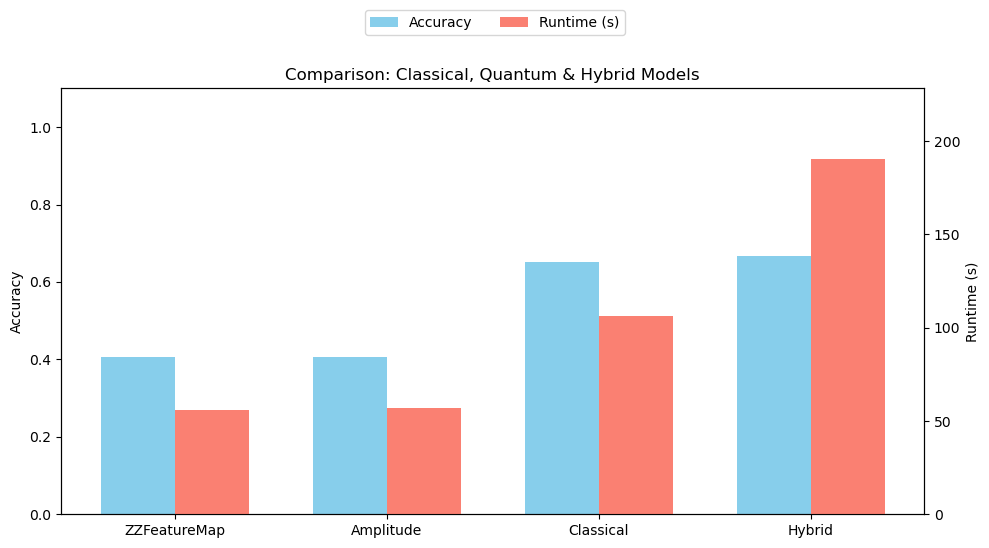

In [84]:
labels = ['ZZFeatureMap', 'Amplitude', 'Classical', 'Hybrid']
accuracies = [acc_zz, acc_amp, acc_c, acc_hyb]
times = [end_zz - start_zz, end_amp - start_amp, end_cls - start_cls, end_hyb - start_hyb]

x = np.arange(len(labels))  # label locations
width = 0.35  # width of bars

fig, ax1 = plt.subplots(figsize=(10, 5))

bars1 = ax1.bar(x - width/2, accuracies, width, label='Accuracy', color='skyblue')
ax2 = ax1.twinx()
bars2 = ax2.bar(x + width/2, times, width, label='Runtime (s)', color='salmon')

ax1.set_ylabel('Accuracy')
ax2.set_ylabel('Runtime (s)')
ax1.set_ylim(0, 1.1)
ax2.set_ylim(0, max(times)*1.2)
ax1.set_title('Comparison: Classical, Quantum & Hybrid Models')

# X-axis labels
plt.xticks(x, labels, rotation=20)

# Legends
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=2)

fig.tight_layout()
plt.show()
